In [2]:
import numpy as np
import cv2 as cv
from imageio import imread, mimread
import matplotlib.pyplot as plt
from copy import deepcopy
import math

# 1

[[83 75 84 ... 76 76 81]
 [84 84 86 ... 84 86 82]
 [86 93 89 ... 79 85 77]
 ...
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]] (1024, 1024)


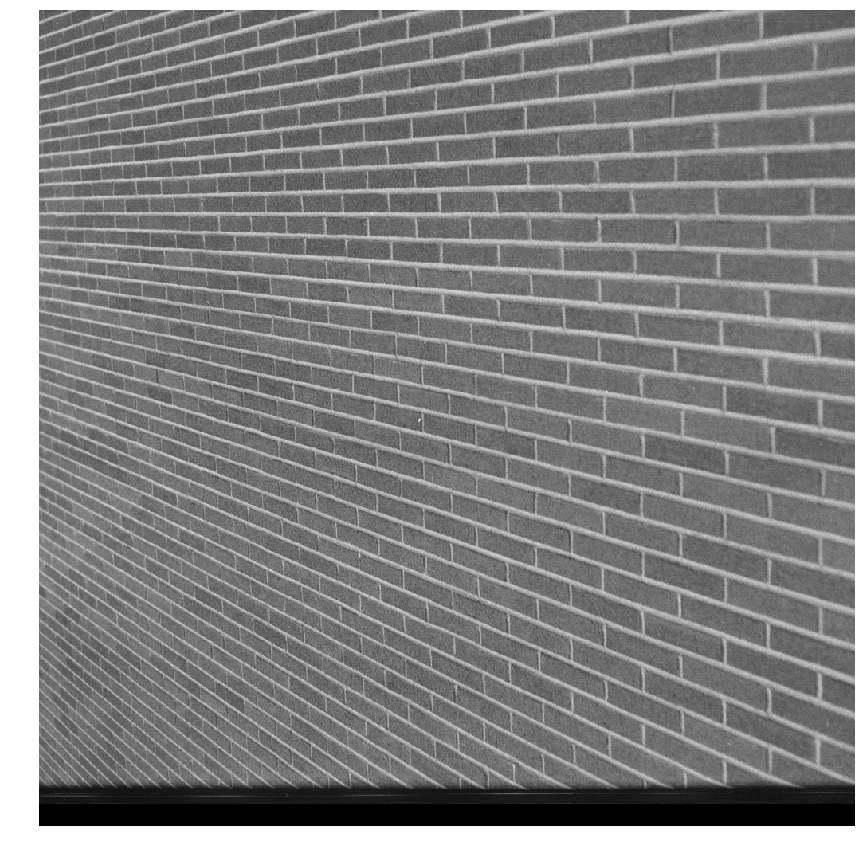

In [116]:
brick = np.array(imread('2-brick_wall.tiff'))
print(brick, brick.shape)
def show_img(img):
    plt.figure(figsize=(30,15))
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.show()
    
show_img(brick)

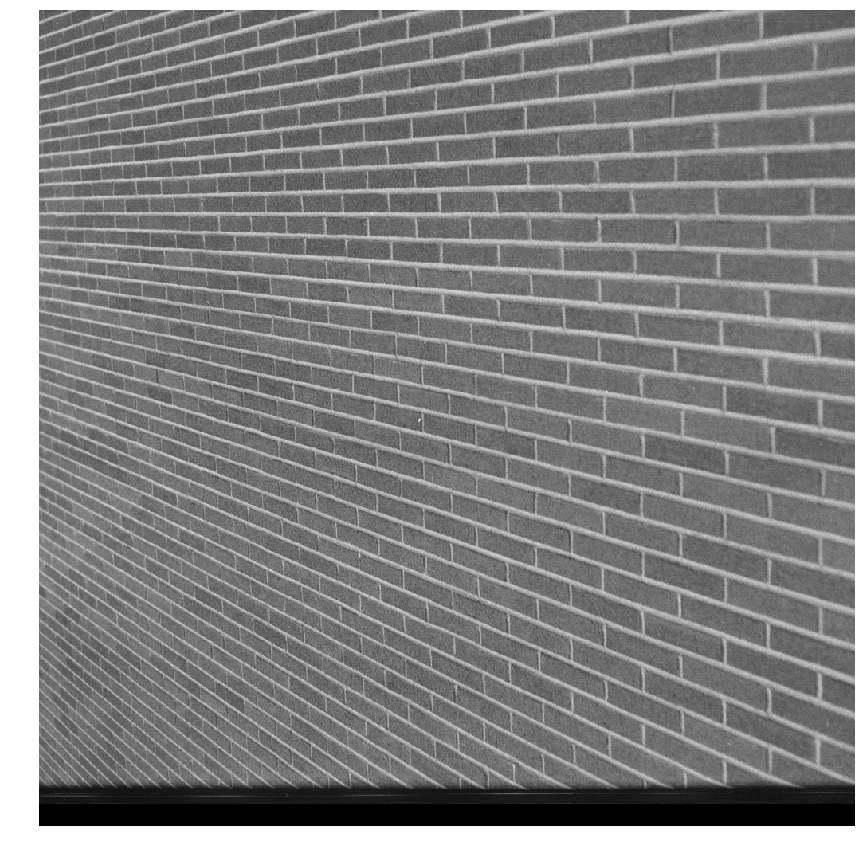

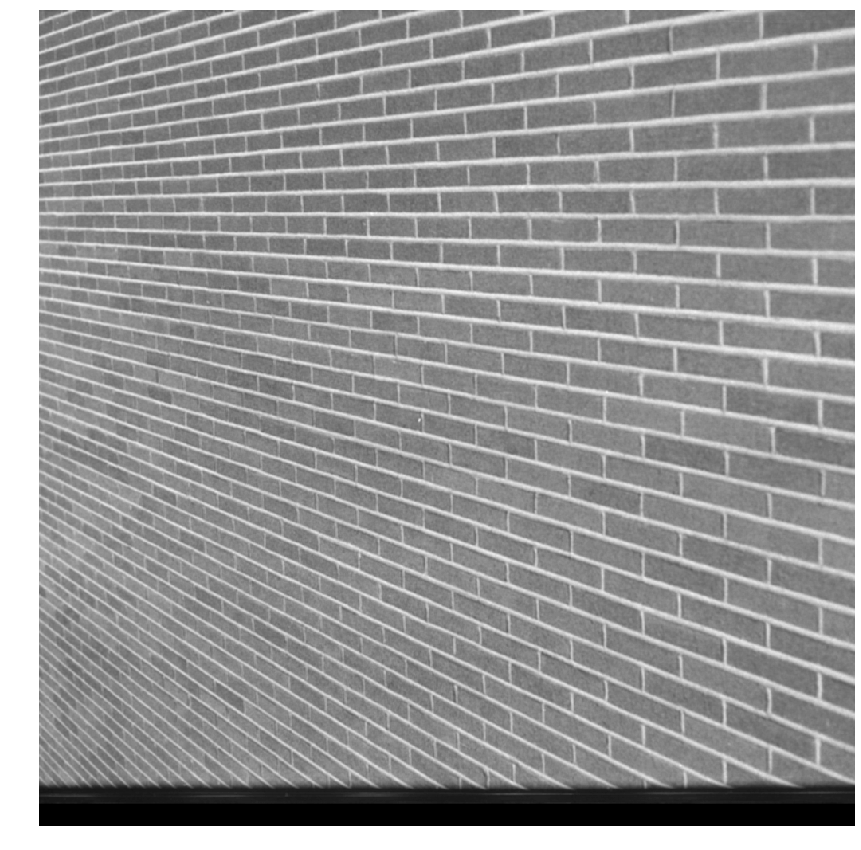

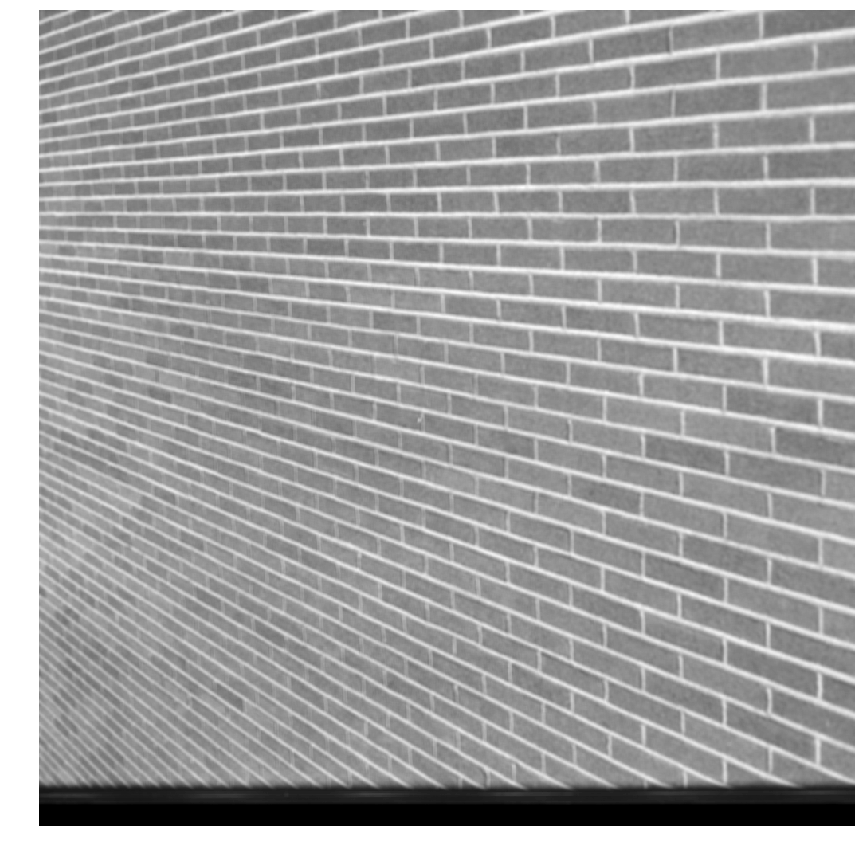

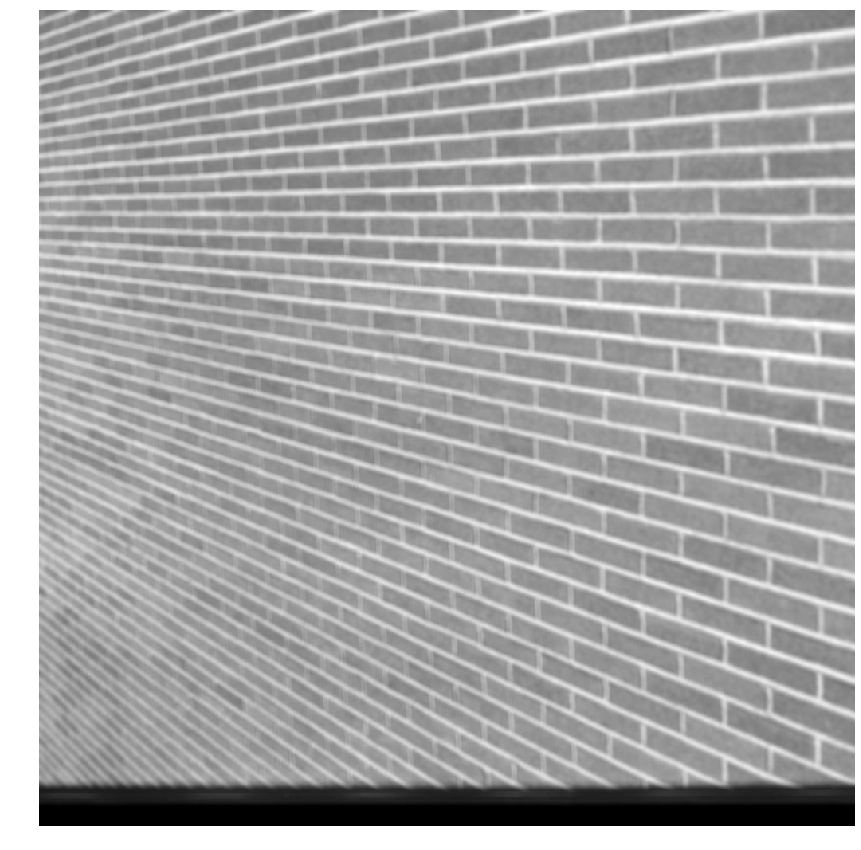

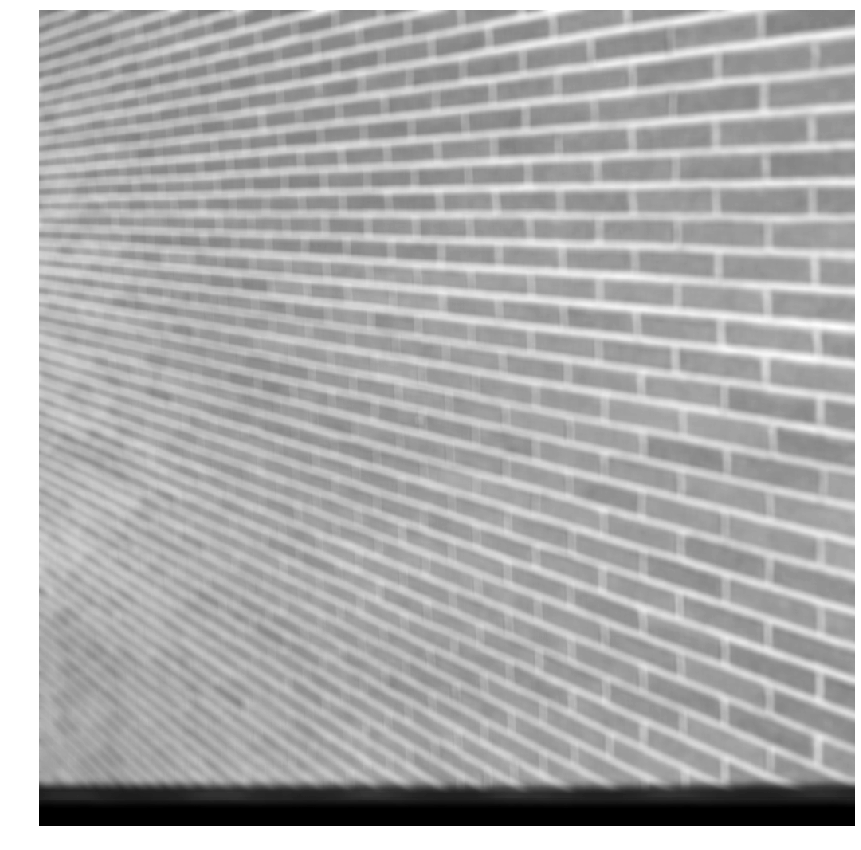

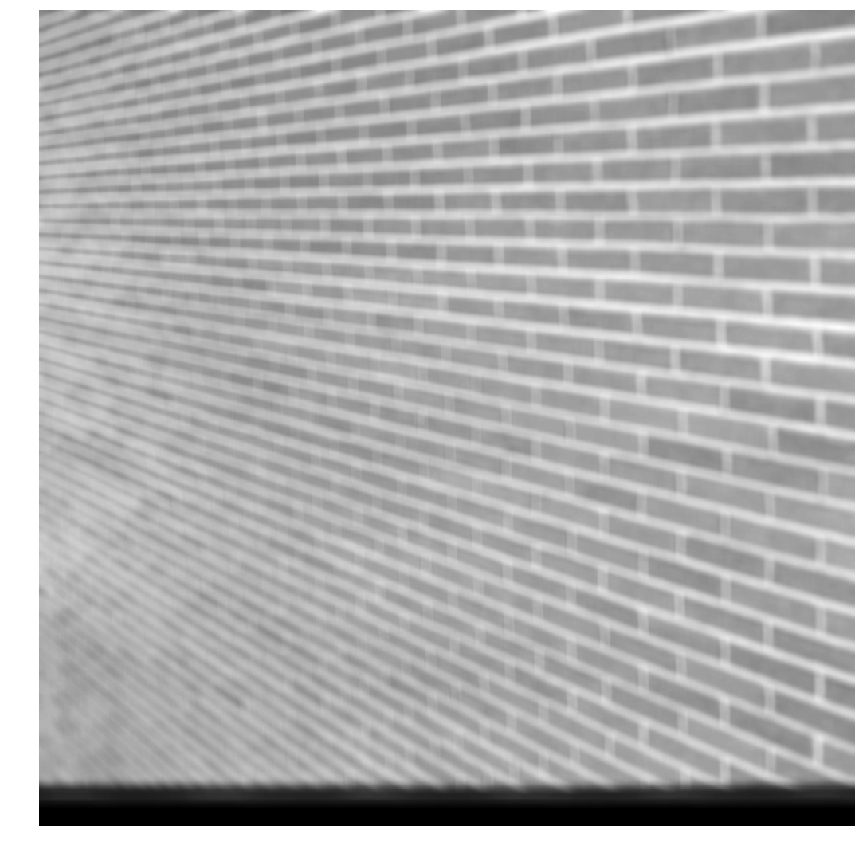

In [127]:
def box_filter(original, filters):
    imgs = []
    for width in filters:
        img = deepcopy(original)
        assert(width % 2 != 0)

        p_width = (width - 1) // 2
        p_img = np.pad(img, ((p_width, p_width), (p_width, p_width)), mode='edge')

        assert(p_img.shape[0] == img.shape[0] + 2 * p_width and p_img.shape[1] == img.shape[1] + 2 * p_width)
        for y in range(len(img)):
            for x in range(len(img[0])):
                magic_square = p_img[y : y + width, x : x + width]
                assert(magic_square.shape == (width, width))
                img[y, x] = np.mean(magic_square)
        show_img(img)
        imgs += [img]
    return imgs
    
box_imgs = box_filter(brick, [1,3,5,7,11,13])

The larger the box size gets, the blurrier the image gets as the single pixel value is the average of a larger window.

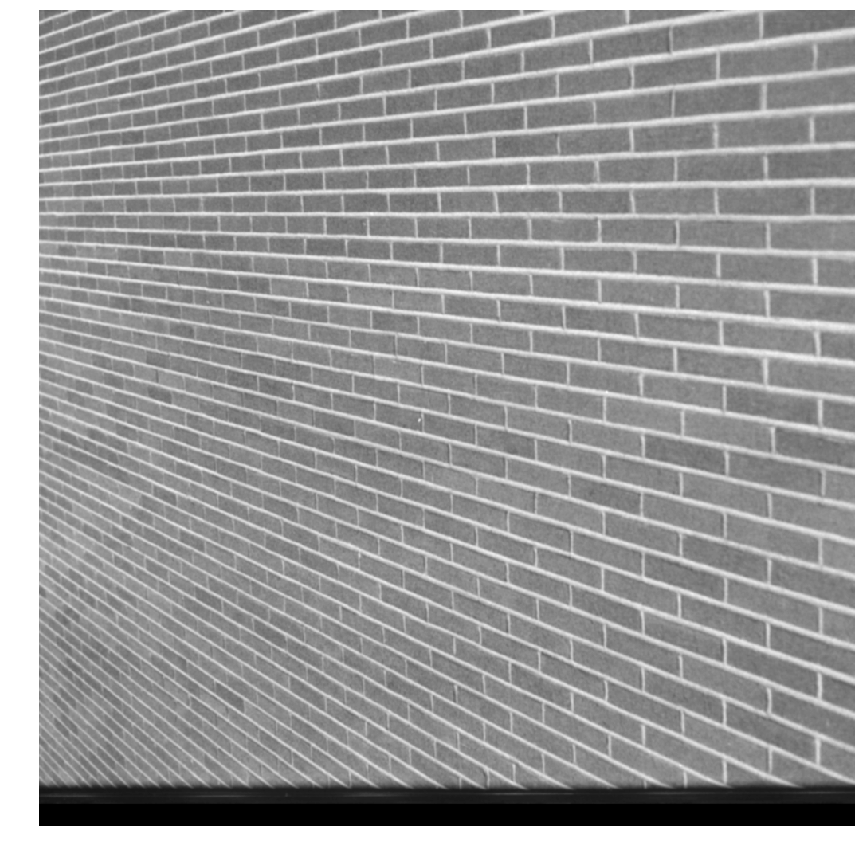

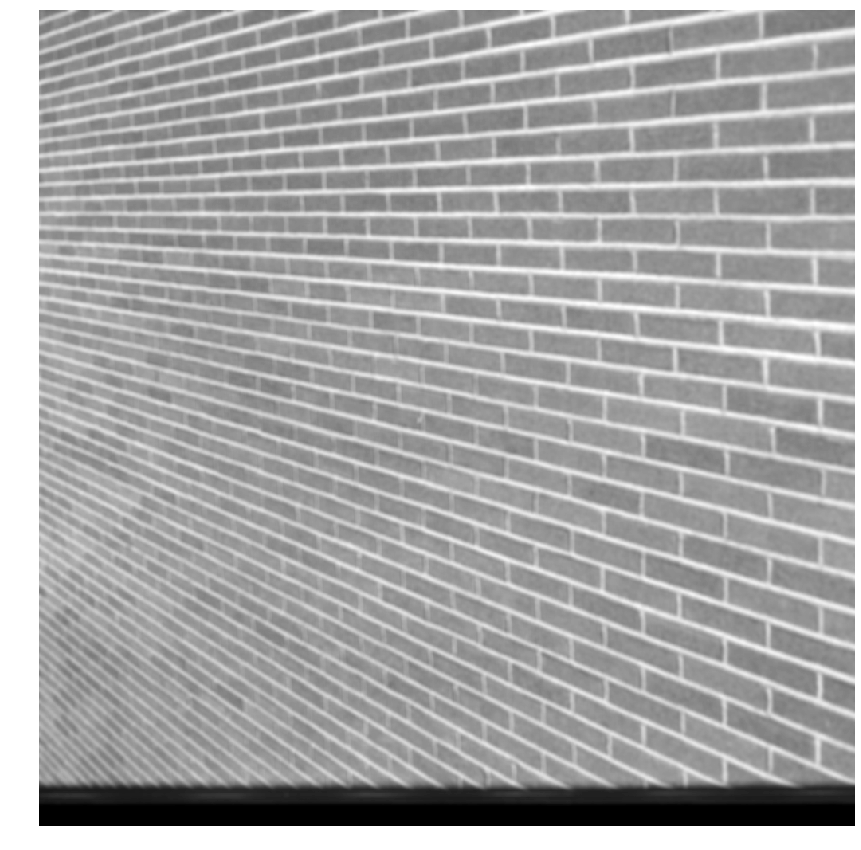

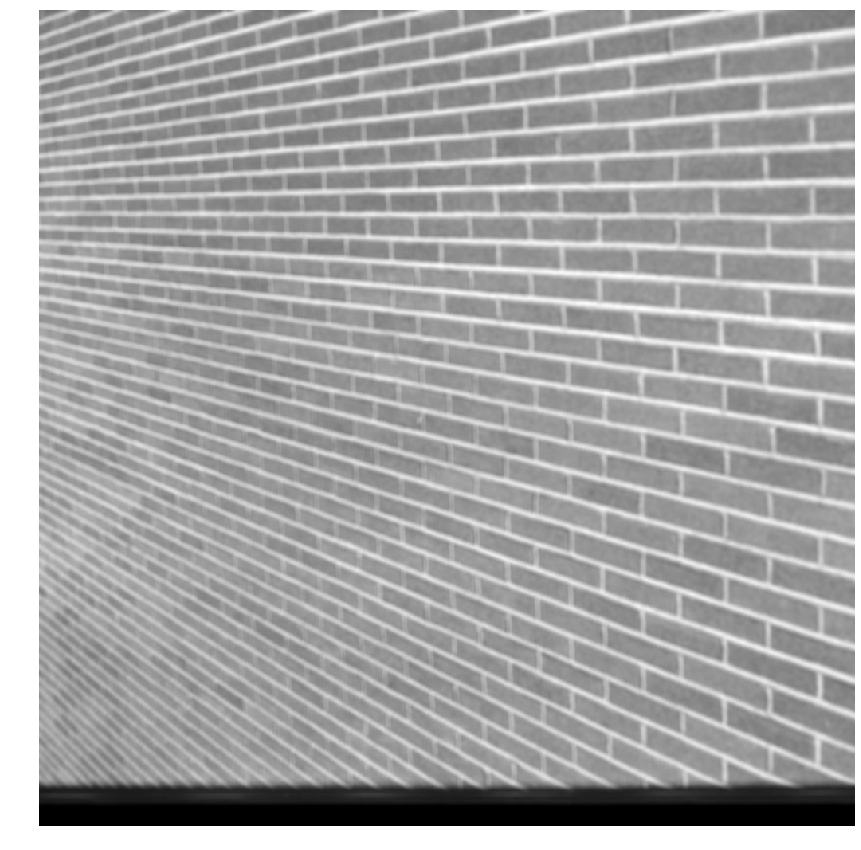

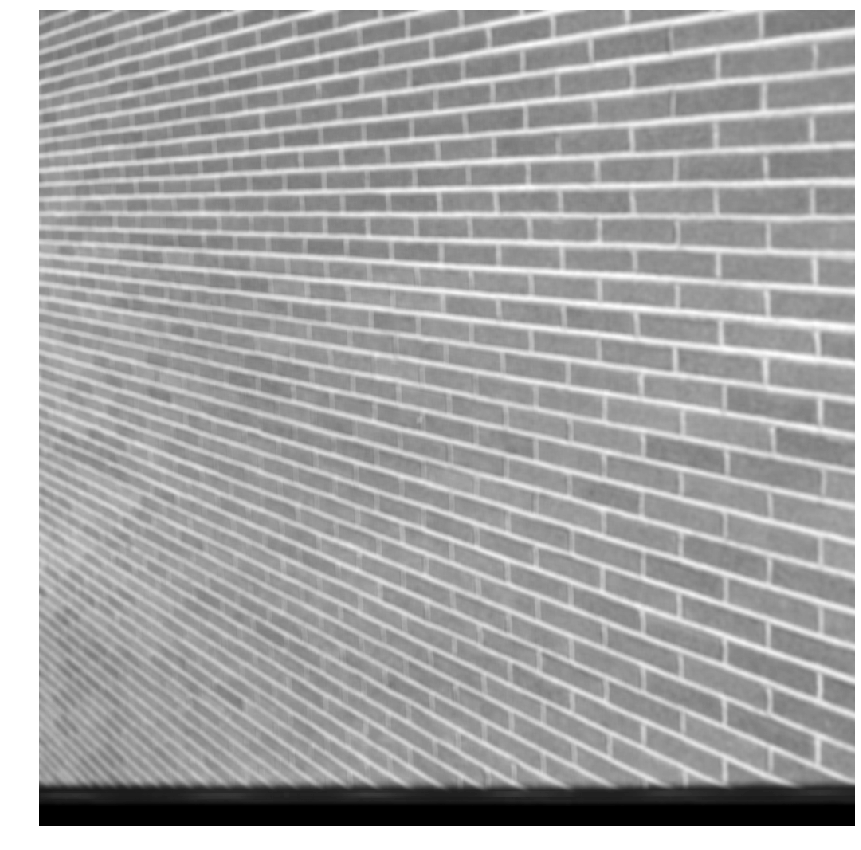

In [128]:
def gaussian_filter(original, filt, stds):
    width = filt
    imgs = []
    for std in stds:
        img = deepcopy(original)
        assert(width % 2 != 0)

        p_width = (width - 1) // 2
        p_img = np.pad(img, ((p_width, p_width), (p_width, p_width)), mode='edge')
        
        filtah = np.zeros((width, width))
        
        def gaussian_calculator(x, y):
            x = abs(p_width - x)
            y = abs(p_width - y)
            return (math.e**(-(x**2 + y**2) / (2 * std**2)))
        
        for y in range(width):
            for x in range(width):
                filtah[y][x] = gaussian_calculator(x, y)
                
        filtah = np.array(filtah) / np.sum(filtah)

        assert(p_img.shape[0] == img.shape[0] + 2 * p_width and p_img.shape[1] == img.shape[1] + 2 * p_width)
        for y in range(len(img)):
            for x in range(len(img[0])):
                magic_square = p_img[y : y + width, x : x + width]
                img[y, x] = np.sum(magic_square * filtah)
        show_img(img)
        imgs += [img]
    return imgs
        
gauss_imgs = gaussian_filter(brick, 7, [1,3,5,7])

As the std increases, the pixels around the center pixel get more weight causing more blur.

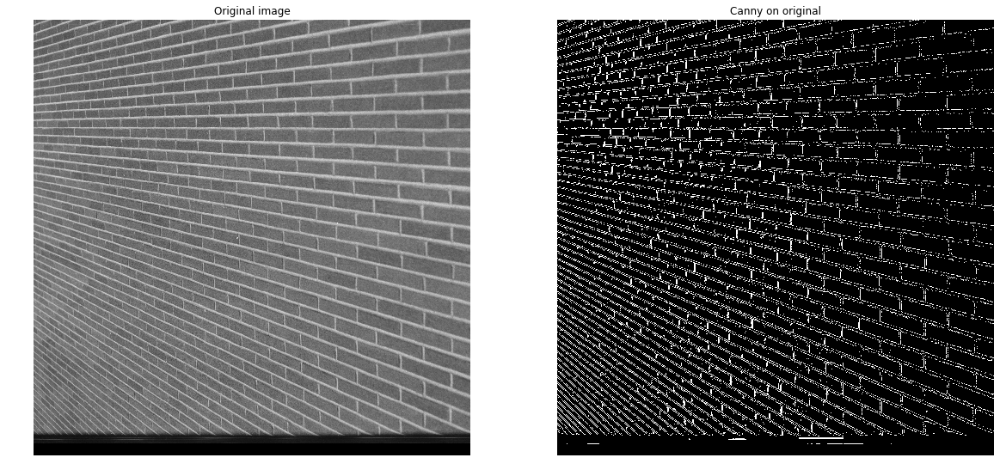

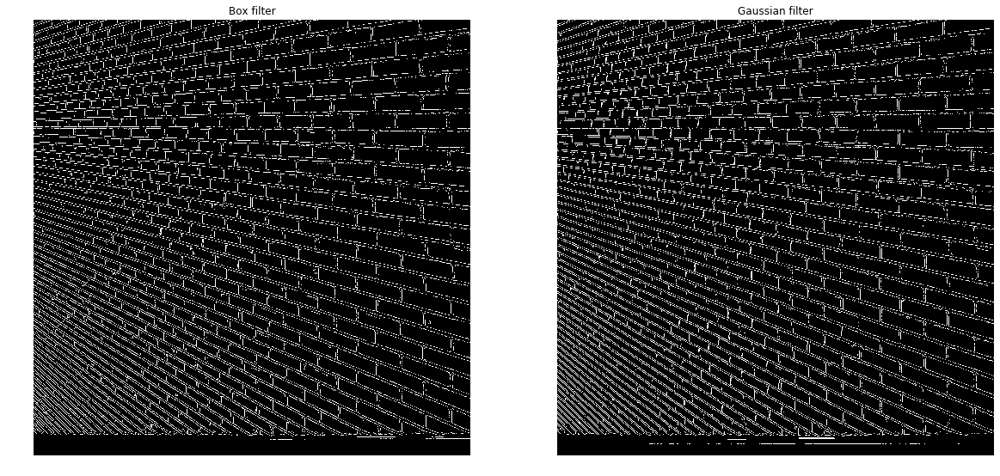

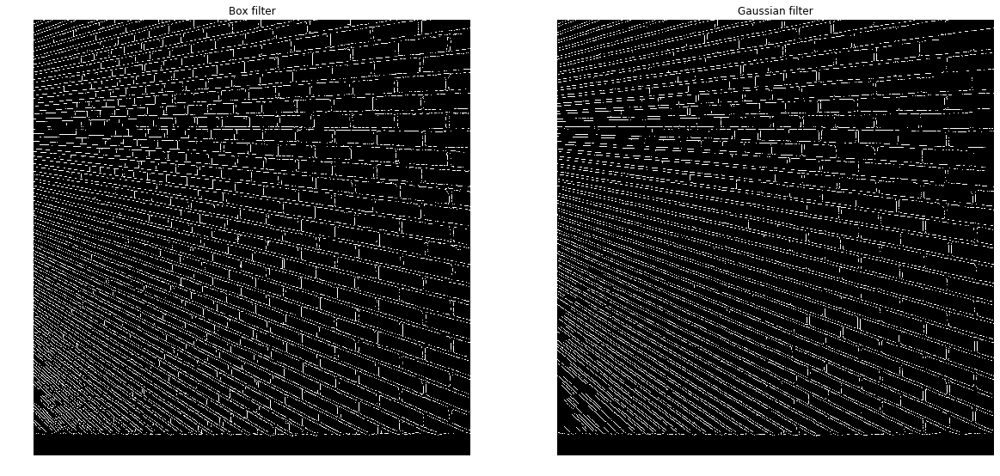

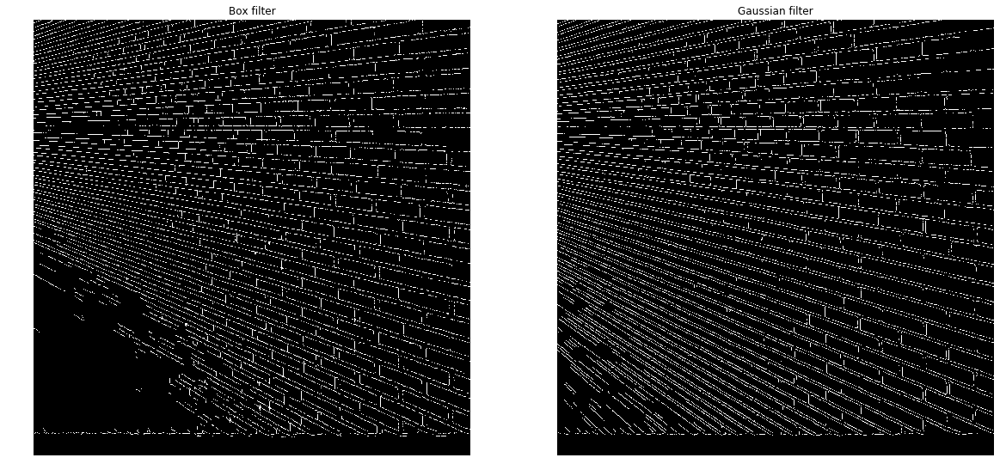

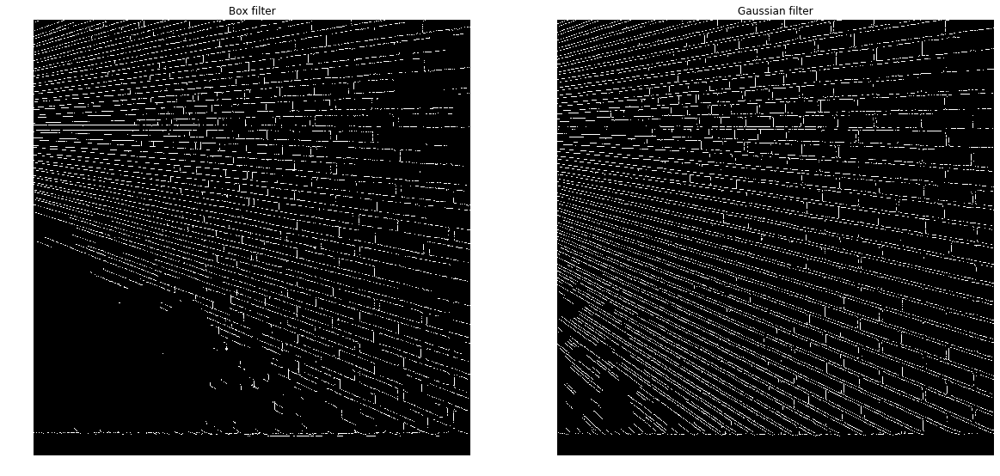

In [212]:
def comp_plot(yks, kaks, t1, t2):
    plt.figure(figsize=(20,10))
    plt.subplot(121)
    plt.title(t1)
    plt.imshow(yks, cmap='gray')
    plt.axis('off')
    plt.subplot(122)
    plt.title(t2)
    plt.imshow(kaks, cmap='gray')
    plt.axis('off')
    plt.subplot(121)
    

box_comps = box_imgs[-4:]
gauss_comps = gauss_imgs
assert(len(box_comps) == len(gauss_comps))

norm_edges = cv.Canny(brick, 120,130)
comp_plot(brick, norm_edges, 'Original image', 'Canny on original')

for box, gauss in zip(box_comps, gauss_comps):
    comp_plot(cv.Canny(box, 20, 50), cv.Canny(gauss, 50, 80), 'Box filter', 'Gaussian filter')

Here it is quite difficult to tell which is better since most of the differences come from tuning the hysteresis min and max val parameters and depending on what values you pick you can get quite similar results with both filters. Also it might not be very interesting to compare these two as the OpenCV Canny algorithm applies a Gaussian 5x5 filter as a default on the image so it seems that it might be best to just use that filter instead of applying a double filter on the image.

But generally it would seem that the gaussian filter preserves the edges better as it would make sence since the gaussian filter sets the most weight on the pixel itself, so while it blurs the image the center pixel is considered to be the most important and thus the features of the image are more preserved when compared to the box filter.

But to make sense of how differently the canny filter works one would have to try to find pretty similarly blurred images and see how they compare. Here it would maybe be the first pair which is box filter of 5 and gaussian kernel with std of 1 and window size of 7 and in that case the gaussian is maybe slightly better but perhaps that could be balanced with better hysteresis values.

# 2

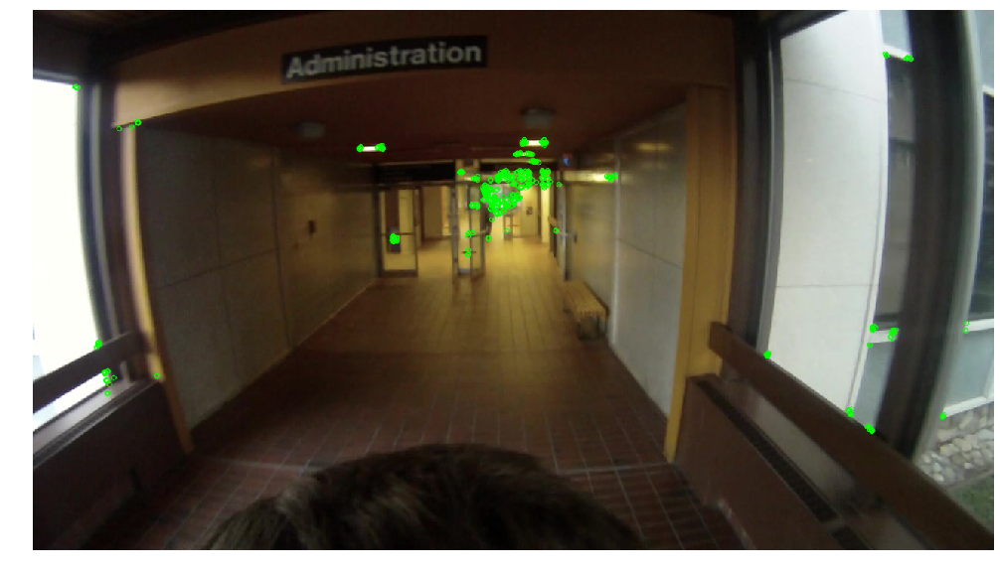

In [14]:

def plot_keypoints(img, kp):
    plt.figure(figsize=(20,10))
    img = deepcopy(img)
    cv.drawKeypoints(img, kp,color=(0,255,0), flags=0, outImage=img)
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    

img1 = imread('2-GOPR1515 03850.jpg')
img2 = imread('2-GOPR1515 03852.jpg')
orb = cv.ORB_create()

kp1, des1 = orb.detectAndCompute(img1, None)
plot_keypoints(img1, kp1)

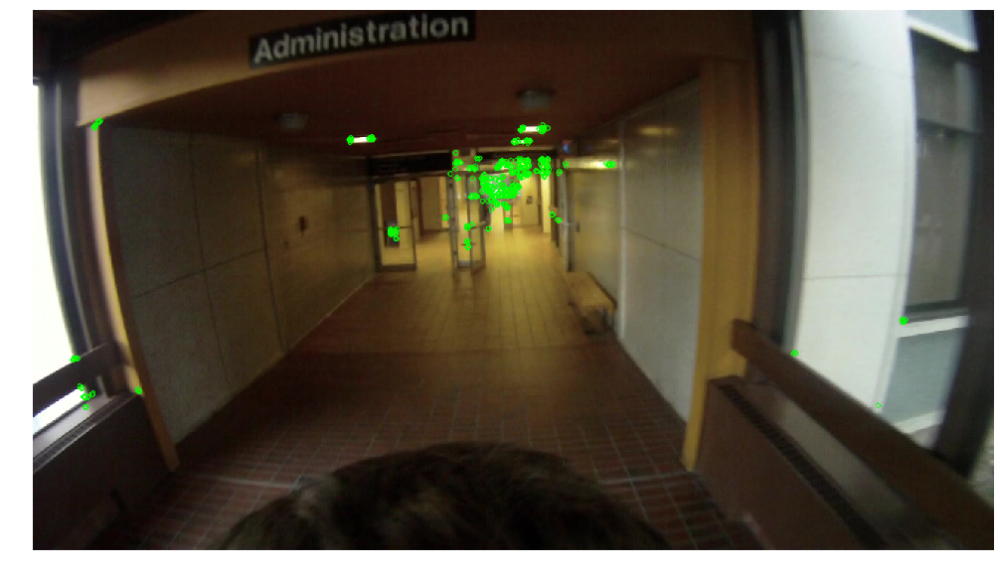

In [15]:
kp2, des2 = orb.detectAndCompute(img2, None)
plot_keypoints(img2, kp2)

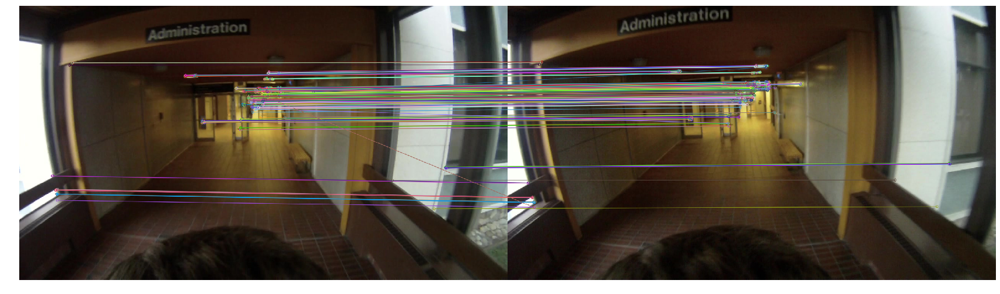

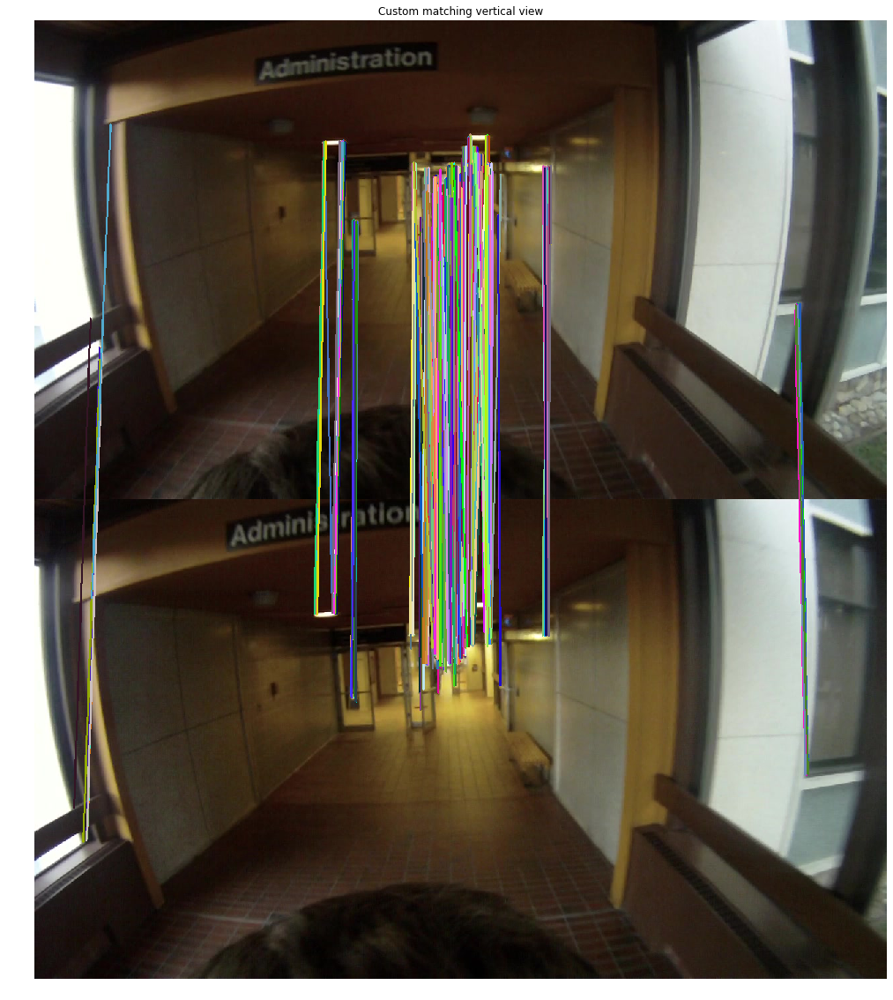

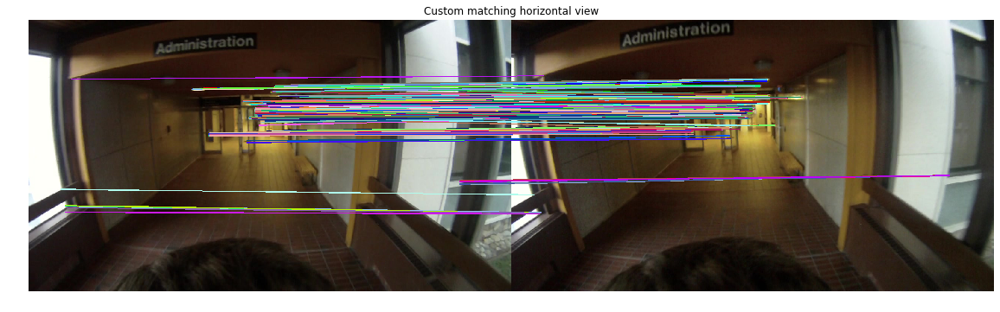

In [127]:

def feat_matcher(des1, des2, kp1, kp2):
    matches = []
    for i, d in enumerate(des1):
        best = (float('inf'), 0)
        for ind, d2 in enumerate(des2):
            p1_x, p1_y = kp1[i].pt
            p2_x, p2_y = kp2[ind].pt
            l2_dist = np.linalg.norm(d - d2) + np.linalg.norm([p1_x - p2_x, p1_y - p2_y])
            if l2_dist < best[0] and np.linalg.norm([p1_x - p2_x, p1_y - p2_y]) < 30:
                best = (l2_dist, ind, np.linalg.norm([p1_x - p2_x, p1_y - p2_y]))
        
        if len(best) > 2 and best[2] < 100:
            matches.append((i, best[1], best[0]))
        
    return matches

def draw_matches(matches, kp1, kp2):
    img3 = np.concatenate((img1, img2), axis=0)
    img4 = np.concatenate((img1, img2), axis=1)
    for m1, m2, dist in matches:
        p1_x, p1_y = kp1[m1].pt
        p2_x, p2_y = kp2[m2].pt
        cv.line(img3, (int(p1_x), int(p1_y)), (int(p2_x), int(p2_y + len(img1))), (255 * np.random.random(), 255 * np.random.random(), 255 * np.random.random()), 2)
        cv.line(img4, (int(p1_x), int(p1_y)), (int(p2_x+ len(img1[0])), int(p2_y)), (255 * np.random.random(), 255 * np.random.random(), 255 * np.random.random()), 2)
        
    
    plt.figure(figsize=(20,20))
    plt.title('Custom matching vertical view')
    plt.axis('off')
    plt.imshow(img3)
    plt.show()
    
    plt.figure(figsize=(20,20))
    plt.title('Custom matching horizontal view')
    plt.axis('off')
    plt.imshow(img4)
    plt.show()
    
matches = feat_matcher(des1, des2, kp1, kp2)
draw_matches(matches, kp1, kp2)

My matcher works somewhat decently since the images are similar enough that you can quite naively match the features. I think the algorithm should maybe do multiple rounds where each round we can displace a pairing if the distance is smaller and this way force there to be only one pairing per point. Currently my algorithm goes just once and matches the point that is closest to it in the second image. Now if we filter the matches to have a maximum distance it looks pretty ok when compared to the opencv matching algorithm, but since every point gets a match some of the matches are not very good without this distance limitataion. I don't also know how well the descriptors would work when the image would be very different instead of only just slightly different.

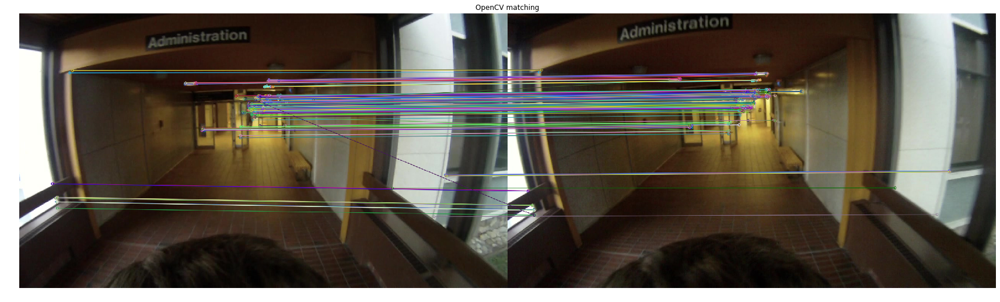

In [128]:
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)

matches = bf.match(des1,des2)
plt.figure(figsize=(30,15))
matches = sorted(matches, key = lambda x:x.distance)
img3 = np.concatenate((img1, img2), axis=1)
cv.drawMatches(img1, kp1, img2, kp2, matches, flags=2, outImg=img3)
plt.axis('off')
plt.title('OpenCV matching')
plt.imshow(img3)
plt.show()